**Atenção: Devido a natureza dos dados, para correto funcionamento, este notebook precisa ser executado em ambiente com memória RAM maior ou igual a 25 Gb.**

#**Ciência e Visualização de Dados**
##**Projeto Final - Entrega 02**
###Alunos: 
###Gleyson Roberto do Nascimento. RA: 043801. Elétrica.
###Negli René Gallardo Alvarado. RA: 234066. Saúde.
###Rafael Vinícius da Silveira. RA: 137382. Física.
###Sérgio Sevileanu. RA: 941095. Elétrica.



##Neste notebook do Google Colaboratory será realzada a análise estatística do Estado de São Paulo durante os anos de 2008 a 2018 segundo o banco de dados [SIHSUS](https://bigdata-metadados.icict.fiocruz.br/dataset/sistema-de-informacoes-hospitalares-do-sus-sihsus/resource/ae85ac54-6734-43b8-a820-6129a854e1ff).

##Desta forma, algumas definições iniciais e um disclaimer se fazem necessários para este projeto:

##Será definido como **diagnóstico correto** aquele em que houve apenas um diagnóstico de CID10, sem alterações durante o período até a alta;  
##Será definido como **diagnóstico equivocado** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte do mesmo grupo, de forma que é plausível o equívoco dada a semelhança de sintomas entre os CID10;
##Será definido como **falha de diagnóstico** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte de grupos distintos, de forma que embora possam existir sintomas semelhantes entre os CID10, caberia ao profissional uma análise mais aprofundada antes do diagnóstico.
##**Disclaimer**: Considerando a natureza do banco de dados do SIHSUS, isto é, um Big Data em que inúmeros funcionários do Sistema Único de Saúde possuem acesso e inserem os dados de forma manual em realdades e condições bastante distintas, existe a séria possibildade de erro sistemático, desta forma, a acurácia deste trabalho deve ser considerada com ressalvas.

##Instalando e Importando as Bibliotecas Necessárias.

In [ ]:
!pip install dask[complete]
!pip install -U -q PyDrive

In [ ]:
%load_ext google.colab.data_table
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import dask
from dask import dataframe as dd
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from google.colab import files
from oauth2client.client import GoogleCredentials
pd.set_option('display.max_columns', None)
pd.options.display.precision = 2
pd.options.display.max_rows = 50
import seaborn as sns
import missingno as msno
import matplotlib as mpl
from matplotlib import rcParams
mpl.rc('figure', max_open_warning = 0)
import statsmodels.api as sm
from statsmodels.api import graphics
import statsmodels.formula.api as smf
import statsmodels.stats.multicomp as multi
from scipy.stats import pearsonr
from scipy.stats import spearmanr
pd.set_option('display.max_columns', None)
import itertools
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

##Fazendo Autenticação do Gooogle Drive, Baixando os Arquivos e Criando Dataframes.

##O dicionário de Variáveis para os arquivos se econtra no [GitHub](https://github.com/grnbatera/Data4health/blob/main/assets/Dicion%C3%A1rio%20de%20Vari%C3%A1veis.csv) 



In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
ids = ['1Hdzz218LvSzz_reDjndKZ2a6r_M_zKl-','1LcqDxhUAIwVEsMEcrfAAQGjoQvCD8qGn','19zx0YYD10ddYYGGk5BOwKcvLSlyE0DcQ','1vffaXC_qag8_dwf49xDPL7CctAxZ6_x-','16g9O_wwsowh5V6CHNRWxnpA1rQtxZX7G']
estados = ['SP','BA','PR','PA','GO']
arquivo = ['sp.pkl','ba.pkl','pr.pkl','pa.pkl','go.pkl']

In [ ]:
dflist=[]
for i in range (len(ids)):
  fileDownloaded = drive.CreateFile({'id':ids[i]})
  fileDownloaded.GetContentFile(arquivo[i])
  globals()[estados[i]] = pd.read_pickle(arquivo[i])
  globals()[estados[i]] = (globals()[estados[i]]).reset_index(drop=True)
  dflist.append(eval(estados[i]))

###Baixando arquivo com Valores Anuais de Custo por Internação e Atendimento e fazendo o merge com o arquivo principal do SIHSUS.

In [ ]:
fileDownloaded = drive.CreateFile({'id':'1corB_xGrJ3NDFpIXuKDl6Dri_tlPLzI0'})
fileDownloaded.GetContentFile('anual.xlsx')
anual = pd.read_excel('anual.xlsx',sheet_name='anual')

In [ ]:
anual['cep'] = [i[0] for i in anual.v241.str.split(' ').values]

In [ ]:
anual['cep']=anual['cep'].astype('int64')
anual.columns = ['v1',	'v241',	'v242',	'v243',	'v244',	'v245',	'v246',	'v247',	'v248',	'v249',	'v250',	'v251',	'v252','v0']

In [ ]:
full = pd.merge(SP,anual, on=['v0','v1'],how='left')

In [ ]:
full

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
0,350000,2008,12,1,4.37e+13,3508123670931,AIH CNRAC,3508123670931,1,Normal,12580000,354430,35,19870603,1,Masculino,0,0,0,0,Não utilizou UTI,0,0,1,401020100,415040035,391.97,215.91,607.88,0.0,263.15,20081201,20081202,I792,NaN,12,Alta melhorado,61,NaN,NaN,2,Estadual plena,0,Não,350250,35,4,Anos,21,1,1,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,2083051,NaN,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,99,NaN,NaN,21,HE35000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,354430,Roseira,ROSEIRA,N,N,N,35,3590,3524,35900,-22.90,-45.30,551.0,130.19,354430,350250,Aparecida,APARECIDA,N,N,N,35,3590,3524,35900,-22.85,-45.23,542,120.94,350250,SP,35,SAO PAULO,SP,SAO PAULO,Região Sudeste,Região Sudeste,São Paulo,SP,São Paulo,SP,Aparecida,Roseira,NaN,NaN,Circ.Fé Vale/Histórico,Circ.Fé Vale/Histórico,Guaratinguetá/Aparecida,NaN,Vale Paraíba SP,Vale Paraíba SP,Guaratinguetá,Taubaté,Taubaté,Circ. da Fé-V. Histórico,Circ. da Fé-V. Histórico,NaN,Brasil,Não Informado,Cirúrgico,DEBRIDAMENTO DE ULCERA / DE TECIDOS DESVITALIZ...,EXTIRPACAO E SUPRESSAO DE LESAO DE PELE E DE T...,21,15-49a,15-24a,20-24a,Capítulo IX - Doenças do aparelho circulatório,"Doenças das artérias, das arteríolas e dos cap...","Transtornos das artérias, das arteríolas e dos...",Angiopatia periférica em doenças classificadas...,NaN,NaN,NaN,NaN,2008,seg,2008,ter,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,350000,2008,12,1,4.37e+13,3508123671393,AIH CNRAC,3508123671393,1,Normal,12570000,350250,35,20080812,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,2,415040027,415040027,448.86,170.11,618.97,0.0,267.95,20081127,20081129,T814,W999,12,Alta melhorado,61,NaN,NaN,2,Estadual plena,0,Não,350250,35,3,Meses,3,2,2,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,2083051,NaN,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,1,Branca,NaN,22,HE35000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,350250,Aparecida,APARECIDA,N,N,N,35,3590,3524,35900,-22.85,-45.23,542.0,120.94,350250,350250,Aparecida,APARECIDA,N,N,N,35,3590,3524,35900,-22.85,-45.23,542,120.94,350250,SP,35,SAO PAULO,SP,SAO PAULO,Região Sudeste,Região Sudeste,São Paulo,SP,São Paulo,SP,Aparecida,Aparecida,NaN,NaN,Circ.Fé Vale/Histórico,Circ.Fé Vale/Histórico,Guaratinguetá/Aparecida,Guaratinguetá/Aparecida,Vale Paraíba SP,Vale Paraíba SP,Guaratinguetá,Taubaté,Taubaté,Circ. da Fé-V. Histórico,Circ. da Fé-V. Histórico,NaN,Brasil,Não Informado,Cirúrgico,DEBRIDAMENTO DE FASCEITE NECROTIZANTE,DEBRIDAMENTO DE FASCEITE NECROTIZANTE,0,<1a,<1a,<1a,Capítulo XIX - Lesões; envenenamento e algumas...,"Complicações de cuidados médicos e cirúrgicos,...",Complicações de procedimentos não classificada...,Infecção subseqüente a procedimento não classi...,NaN,NaN,NaN,NaN,2008,qui,2008,sab,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,350000,2008,12,1,4.37e+13,3508123671426,AIH CNRAC,35081236714

###Fazendo o download do arquivo intermediário 1 em pickle para evitar retrabalho caso o Colab dê problema de RAM. 

In [ ]:
with open('full.pkl','wb') as f:
  pickle.dump(full,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('full.pkl')

##Fazendo o tratamento do banco.

###Fazendo uma análise das variáveis para verificar se são numéricas ou categóricas, verificar o tipo e a quantidade de itens únicos por variável.

In [ ]:
draw={}
categoricon = []
categoricost = []
notcategorical = []
k=0
print('\033[1m'+'Valores únicos de '+ estados[k]+'\033[0m')
for col in full:
  draw[col] = full[col].unique()
  print('Variavel: ',col,' | Tipo da Variável: ',full[col].dtypes,' | Quantidade de itens: ',len(draw[col]))
  if full[col].dtypes != 'object' and len(draw[col]) < 5000:
    categoricon.append(col)
  elif full[col].dtypes != 'object' and len(draw[col]) > 5000:
    notcategorical.append(col)
  else:
    categoricost.append(col)    
print('\n')

Valores únicos de SP
Variavel:  v0  | Tipo da Variável:  int64  | Quantidade de itens:  313
Variavel:  v1  | Tipo da Variável:  int64  | Quantidade de itens:  11
Variavel:  v2  | Tipo da Variável:  int64  | Quantidade de itens:  1
Variavel:  v3  | Tipo da Variável:  int64  | Quantidade de itens:  15
Variavel:  v4  | Tipo da Variável:  float64  | Quantidade de itens:  621
Variavel:  v5  | Tipo da Variável:  int64  | Quantidade de itens:  2113805
Variavel:  v6  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v7  | Tipo da Variável:  int64  | Quantidade de itens:  2113805
Variavel:  v8  | Tipo da Variável:  int64  | Quantidade de itens:  2
Variavel:  v9  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v10  | Tipo da Variável:  int64  | Quantidade de itens:  178770
Variavel:  v11  | Tipo da Variável:  int64  | Quantidade de itens:  2779
Variavel:  v12  | Tipo da Variável:  int64  | Quantidade de itens:  27
Variavel:  v13  | Tipo da Variável:  int64  | Qu

###Substituindo valores de Missing para tratamento de categorias.

In [ ]:
full[categoricon] = (full[categoricon]).fillna(99999)
full[categoricost] = (full[categoricost]).fillna('a99999')
full[notcategorical] = (full[notcategorical]).fillna('a99999')
full[['v248','v250','v251','v252']]=full[['v248','v250','v251','v252']].replace('a99999',9.99999)
full[['v243','v249']]=full[['v243','v249']].replace('a99999',99999)

In [ ]:
full2=full.copy()

###Criando categorias numéricas para as variáveis do tipo string.

In [ ]:
for i in range(len(categoricost)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricost[i]])
  full2[categoricost[i]]=le.transform(full2[categoricost[i]])
  print('As categorias de', categoricost[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricost[i]].unique()))

As categorias de v6 eram: ['9' 'AIH CNRAC'] e mudaram para: [0, 1]
As categorias de v9 eram: ['Longa permanência' 'Normal'] e mudaram para: [0, 1]
As categorias de v15 eram: ['Feminino' 'Masculino'] e mudaram para: [0, 1]
As categorias de v23 eram: ['Não utilizou UTI' 'UTI Doador' 'UTI adulto - tipo I'
 'UTI adulto - tipo II' 'UTI adulto - tipo III'
 'UTI coronariana tipo II - UCO tipo II'
 'UTI coronariana tipo III - UCO tipo III' 'UTI de queimados'
 'UTI infantil - tipo I' 'UTI infantil - tipo II'
 'UTI infantil - tipo III' 'UTI neonatal - tipo I'
 'UTI neonatal - tipo II' 'UTI neonatal - tipo III'
 'Utilizou mais de um tipo de UTI'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
As categorias de v48 eram: ['A000' 'A009' 'A010' ... 'Z988' 'Z992' 'Z999'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,

###Criando categorias numéricas para as variáveis do tipo numérico.

In [ ]:
for i in range(len(categoricon)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricon[i]])
  full2[categoricon[i]]=le.transform(full2[categoricon[i]])
  print('As categorias de', categoricon[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricon[i]].unique()))

As categorias de v0 eram: [350000 350010 350030 350050 350070 350100 350110 350130 350160 350170
 350190 350220 350260 350270 350280 350310 350320 350330 350340 350370
 350390 350400 350410 350420 350450 350490 350520 350530 350550 350570
 350580 350590 350600 350610 350630 350635 350640 350650 350660 350670
 350680 350700 350710 350740 350760 350790 350800 350810 350840 350850
 350860 350880 350900 350920 350925 350930 350940 350950 350960 350970
 351000 351020 351040 351050 351060 351080 351100 351110 351140 351150
 351160 351170 351200 351210 351220 351230 351280 351310 351340 351350
 351360 351370 351380 351410 351440 351450 351480 351500 351510 351518
 351520 351540 351620 351630 351640 351660 351670 351690 351700 351740
 351760 351770 351780 351820 351830 351840 351860 351870 351880 351907
 351910 351920 351930 351940 351960 351970 351990 352010 352020 352030
 352040 352050 352070 352090 352130 352170 352180 352190 352220 352230
 352240 352260 352270 352280 352290 352320 352340 3

###Criando categorias numéricas para as variáveis com grande número de valores únicos.

In [ ]:
for i in range(len(notcategorical)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[notcategorical[i]])
  full2[notcategorical[i]]=le.transform(full2[notcategorical[i]])
  print('As categorias de', notcategorical[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[notcategorical[i]].unique()))

###Salvando este arquivo como final.

In [ ]:
with open('full2.pkl','wb') as f:
  pickle.dump(full2,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
files.download('full2.pkl')

###Fazendo a análise estatística para o arquivo final.

In [ ]:
full2.describe()

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
count,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06,2.18e+06
mean,9.57e+01,5.04e+00,0.00e+00,1.88e+00,2.60e+02,1.03e+06,1.00e+00,1.03e+06,5.03e-02,9.50e-01,9.25e+04,1.80e+03,1.90e+01,2.20e+04,5.58e-01,4.42e-01,5.03e-01,5.03e-01,5.03e-01,3.06e-01,3.46e-01,2.28e-02,1.14e+00,5.78e+00,5.54e+02,5.53e+02,4.99e+04,1.06e+04,5.99e+04,1.51e+01,3.46e+04,2.22e+03,1.05e+03,3.58e+03,4.04e+03,6.09e+00,7.86e+00,2.92e+00,1.27e+01,1.11e+01,4.90e-01,5.10e-01,1.38e-01,1.38e-01,2.16e+02,0.00e+00,1.93e+00,1.07e+00,4.11e+01,6.22e+00,6.22e+00,4.60e-02,9.54e-01,7.33e-02,8.08e-01,8.08e-01,6.94e-02,9.31e-01,3.41e-02,1.89e+01,3.01e-02,2.90e+01,1.08e-01,6.13e-02,9.99e-01,9.99e-01,1.88e+03,0.00e+00,0.00e+00,1.61e-03,2.01e-03,2.66e-04,1.33e+01,1.56e-01,4.28e+01,3.30e+02,4.28e+01,2.35e+03,1.31e+03,1.08e+00,9.22e-01,9.68e-01,9.68e-01,4.84e-01,3.24e+00,1.41e+00,2.29e+00,6.32e+00,2.74e+04,8.62e+02,1.90e+02,1.97e+02,8.17e-01,2.72e-01,1.23e+02,1.81e+00,1.82e+00,6.43e+03,2.07e+00,1.81e+00,1.92e+00,1.90e+00,1.89e+00,1.89e+00,1.89e+00,1.89e+00,6.29e-01,6.29e-01,1.80e+03,1.64e+03,1.63e+03,1.74e-03,8.12e-04,2.40e-01,1.90e+01,4.39e+01,2.18e+02,1.41e+02,5.67e+02,1.26e+03,5.67e+02,1.34e+03,1.80e+03,2.16e+02,2.18e+02,2.17e+02,0.00e+00,0.00e+00,2.68e-01,0.00e+00,0.00e+00,8.85e+00,0.00e+00,1.16e+02,2.26e+02,1.61e+02,2.34e+02,2.16e+02,2.49e+01,0.00e+00,2.39e+01,0.00e+00,0.00e+00,

###Fazendo o cálculo da Correlação e P-Valor das Variáveis.

In [ ]:
def pvalor(df,metodo):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    if metodo == 'spearman':
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = spearmanr(df[r], df[c])[1]
    else:
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = pearsonr(df[r], df[c])[1]
    return pvalues

In [ ]:
cid_columns = ['v48','v49','v82','v104','v105']

In [ ]:
metodo = ['pearson','spearman']

In [ ]:
correlacao = []
p_valor = []
for i in range(len(metodo)):
  #Calculando as correlações por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'Coeficientes de Correlação por '+ metodo[i] + '\033[0m')
  print('\n')
  k1 = full2.corr(method=metodo[i])
  correlacao.append(k1)
  print(correlacao[i])
  print('\n')

  #Calculando o p-valor por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'P-valor por '+ metodo[i] + '\033[0m')
  print('\n')
  k2 = pvalor(full2,metodo[i])
  p_valor.append(k2)
  print(p_valor[i])
  print('\n')

Coeficientes de Correlação por pearson


        v0        v1  v2    v3    v4        v5        v6        v7    v8  \
v0    1.00  1.84e-02 NaN -0.03  0.24  5.14e-02  7.61e-03  5.14e-02 -0.08   
v1    0.02  1.00e+00 NaN  0.01  0.02  9.66e-01 -1.53e-03  9.66e-01 -0.05   
v2     NaN       NaN NaN   NaN   NaN       NaN       NaN       NaN   NaN   
v3   -0.03  1.37e-02 NaN  1.00 -0.03 -1.80e-02  7.67e-03 -1.80e-02  0.20   
v4    0.24  1.64e-02 NaN -0.03  1.00  5.68e-03 -9.59e-03  5.68e-03  0.05   
...    ...       ...  ..   ...   ...       ...       ...       ...   ...   
v248  0.81  6.06e-02 NaN -0.03  0.10  9.33e-02  8.40e-03  9.33e-02 -0.07   
v249 -0.01 -2.15e-02 NaN  0.02 -0.06 -4.56e-02 -2.53e-03 -4.56e-02  0.08   
v250 -0.57 -7.33e-02 NaN  0.05 -0.10 -1.17e-01 -7.80e-03 -1.17e-01  0.16   
v251 -0.34  9.82e-04 NaN  0.03 -0.08 -3.99e-02 -6.00e-03 -3.99e-02  0.09   
v252 -0.70  2.33e-02 NaN  0.02 -0.07 -2.14e-02 -8.12e-03 -2.14e-02  0.11   

        v9       v10       v11       v12   v13

###Fazendo o heatmap de Corrrelação para as variáves com CID10 definido.

In [ ]:
def corr_to_target(dataframe, target, title=None, file=None):
  plt.figure(figsize=(10,40))
  sns.set(font_scale=1)
  sns.heatmap(dataframe.corr(method = 'spearman')[[target]].sort_values(target,ascending=False)[1:],annot=True,cmap='coolwarm')
  if title: plt.title(f'\n{title}\n', fontsize=18)
  #plt.xlabel('') — # optional in case you want an x-axis Label
  #plt.ylabel('') # optional in case you want a y-axis Label
  if file: plt.savefig(file,bbox_inches='tight', format='png',dpi=600)
  plt.show();
  return

In [ ]:
z=sorted(np.unique(['v225','v151','v147','v143','v139','v137','v125','v7','v46','v237','v79','v78','v83','v153','v149','v145','v141','v105','v49','v127','v125','v5','v46','v47','v237','v153','v149','v145','v141','v104','v49','v127','v125','v46','v47','v1','v5']))

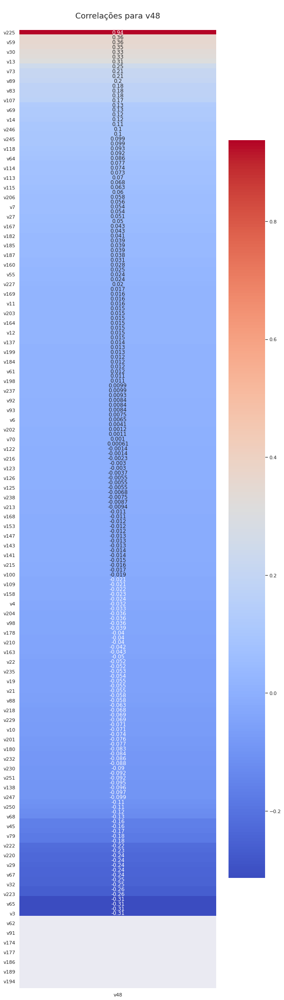

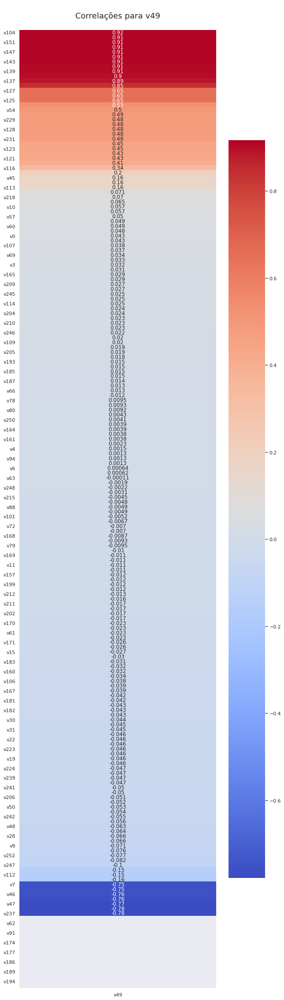

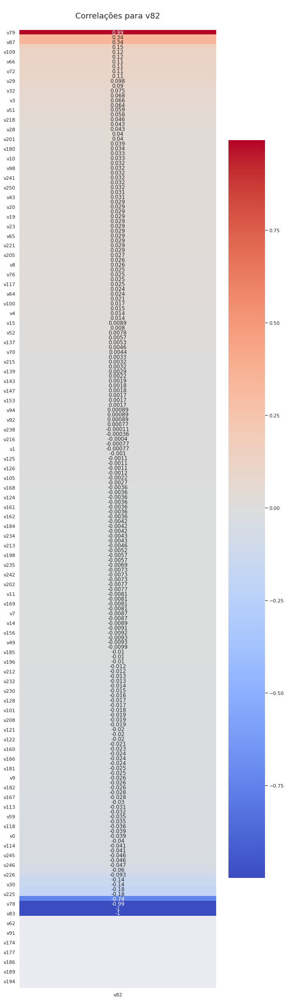

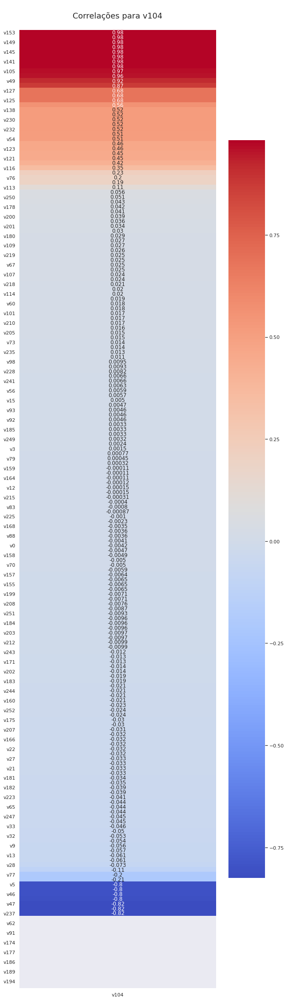

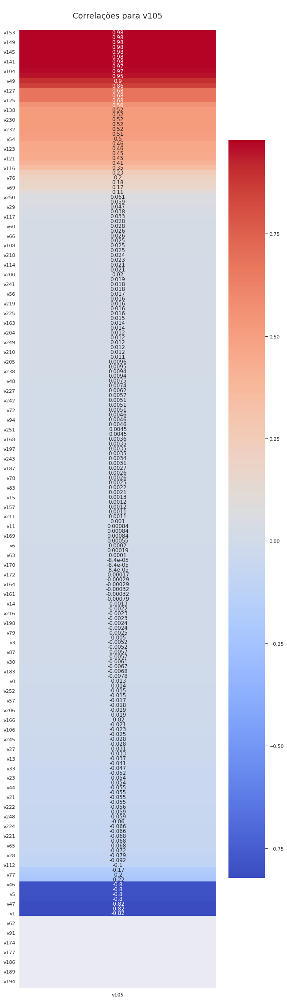

In [ ]:

for col in cid_columns:
  corr_to_target(full2,col,title = 'Correlações para '+ col, file='/content/drive/MyDrive/zica/correlacaosp'+col+'.png')

###Criando uma matriz com um string correspondente ao match de correlação e p-valor.

In [ ]:
def classecat(num):
  if abs(num) >= 0.7:
    return 'Correlação Forte'
  elif 0.5 <= abs(num) < 0.7:
    return 'Correlação Moderada'
  elif 0.3 <= abs(num) < 0.5:
    return 'Correlação Fraca'
  else:
    return 'Não há Correlação'

In [ ]:
def classepval(num):
  if abs(num) < 0.001:
    return 'Certeza Alta'
  elif 0.01 <= abs(num) < 0.05:
    return 'Certeza Moderada'
  elif 0.05 <= abs(num) < 0.1:
    return 'Certeza Fraca'
  else:
    return 'Nível de Certeza Ináceitável'

In [ ]:
relacoes = correlacao.copy()
for i in range(len(relacoes)):
  for col in relacoes[i]:
    (relacoes[i])[col] = (relacoes[i])[col].map(classecat)+ ' e '+ (p_valor[i])[col].map(classepval)

In [ ]:
relacoes[0]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Correlação Moderada e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correla

In [ ]:
relacoes[1]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Correlação Moderada e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Co

###Salvando a matriz de correlações em pickle.

In [ ]:
with open('relacoes.pkl','wb') as f:
  pickle.dump(relacoes,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('relacoes.pkl')

###Fazendo o scatterplot das variáveis de CID10 com as demais variáveis do banco para análise gráfica de correlação.

In [ ]:
x_vars = z
y_vars=cid_columns

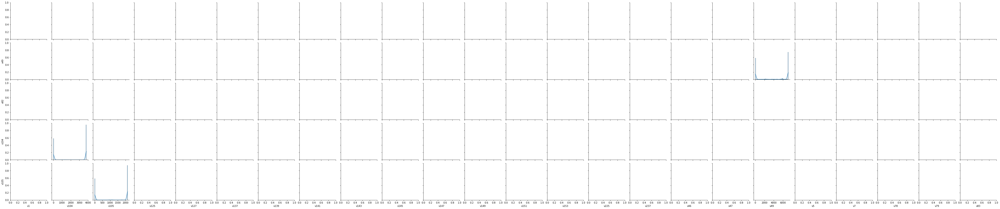

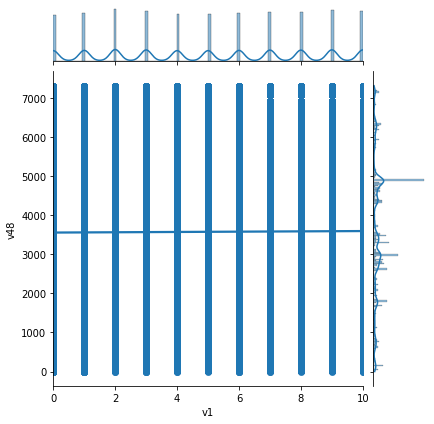

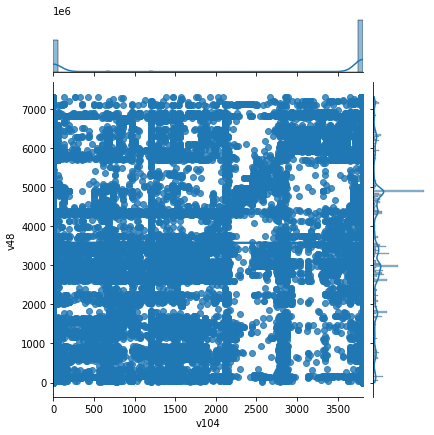

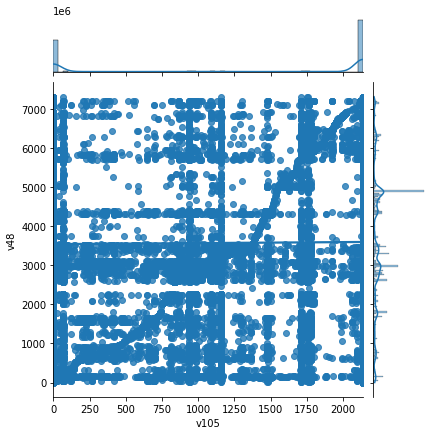

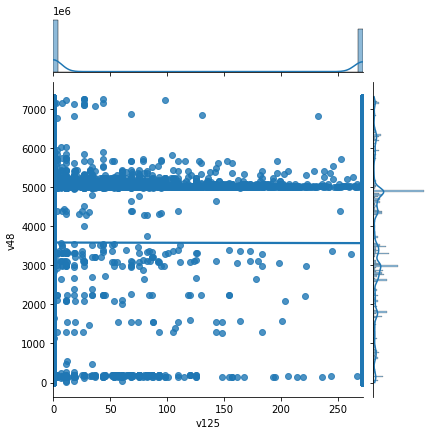

...

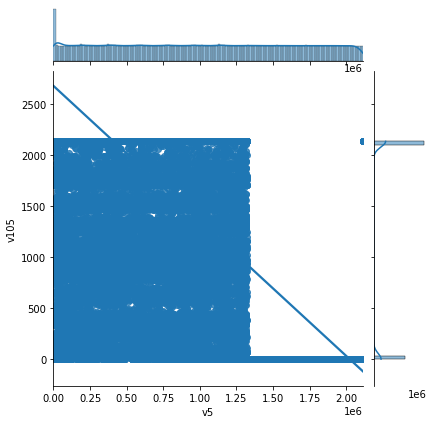

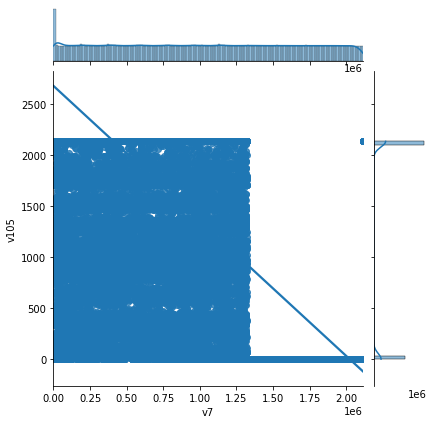

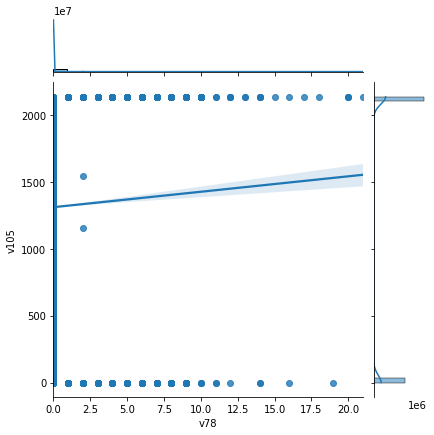

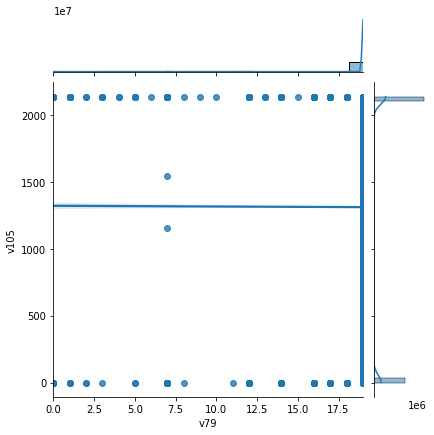

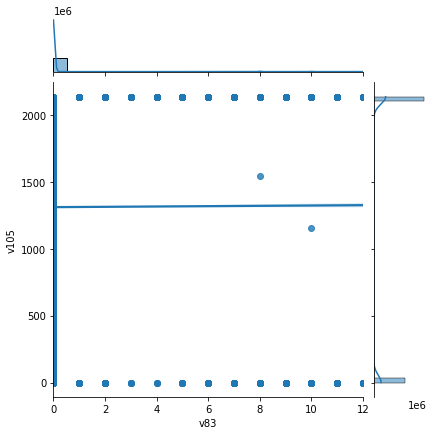

In [ ]:
plt.ioff()
g = sns.PairGrid(full2,x_vars = x_vars, y_vars=y_vars, palette='rocket')
g.map_diag(sns.histplot, kde=True)
g.map_offdiag(sns.jointplot, kind='reg')
#plt.savefig('/content/drive/MyDrive/zica/pairplotsp01'+x_vars+y_vars+'.png',format = 'png',dpi=600)
plt.show()

###Fazendo o Q-Q Plot das Variáveis do Banco.

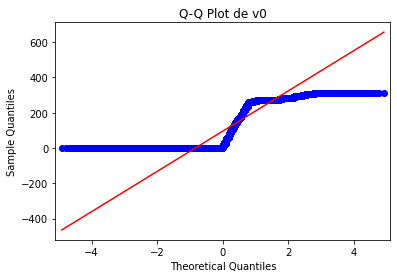

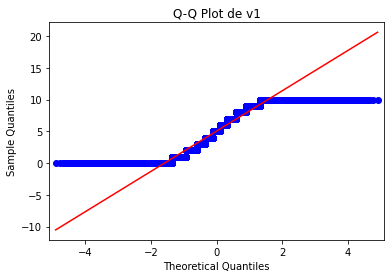

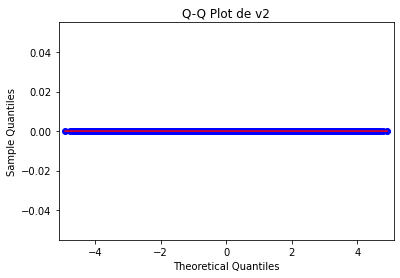

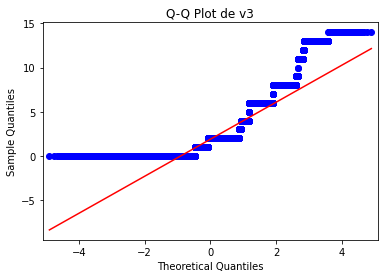

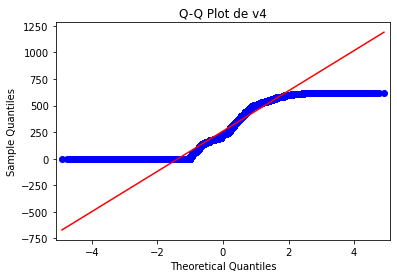

...

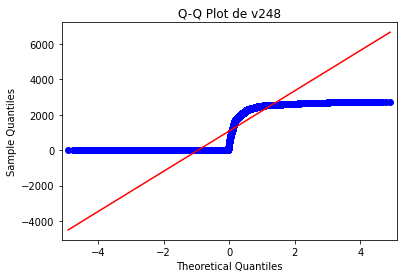

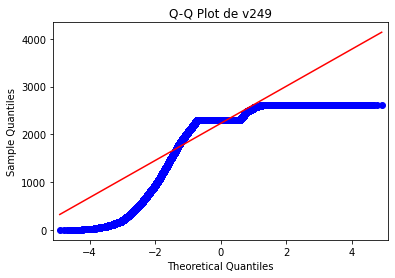

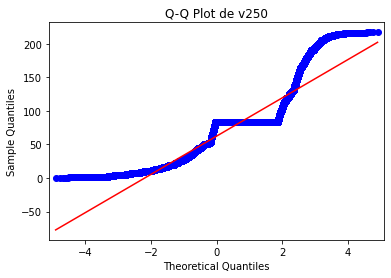

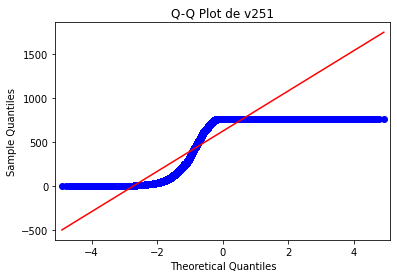

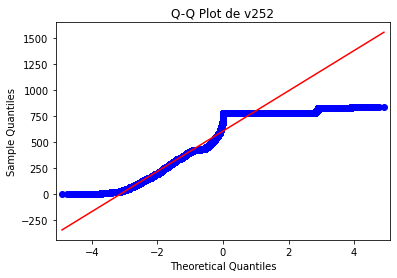

In [ ]:
plt.ioff()
for col in full2.columns:
  sm.qqplot(full2[col], line='s')
  plt.title('Q-Q Plot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();

###Fazendo o Box Plot das Variáveis.

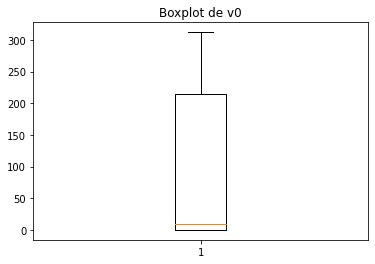

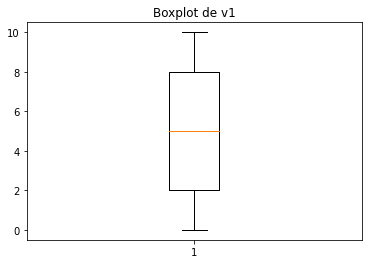

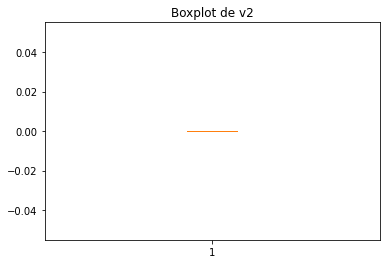

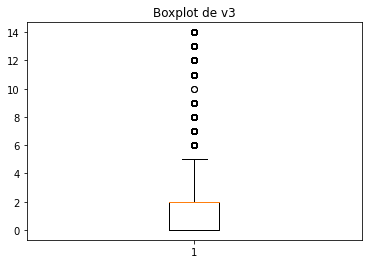

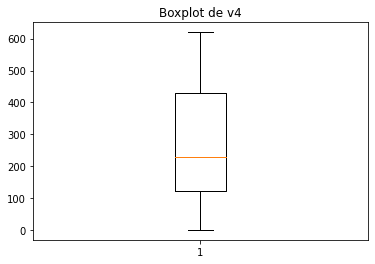

...

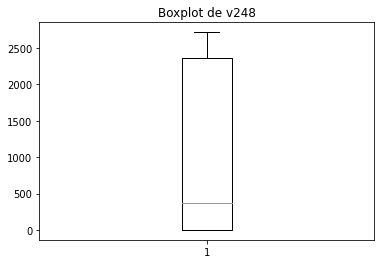

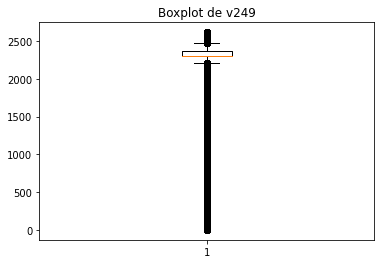

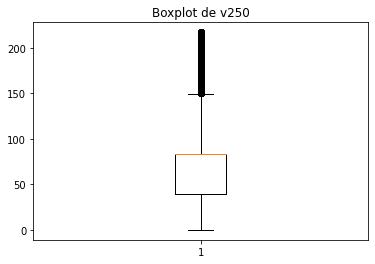

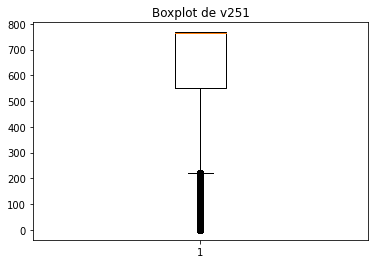

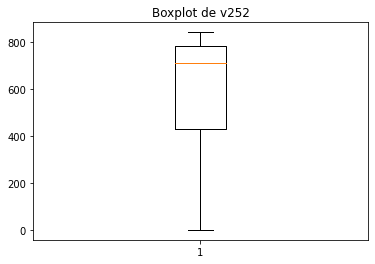

In [ ]:
plt.ioff()
for col in full2.columns:
  plt.boxplot(full2[col])
  plt.title('Boxplot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();